In [1]:
!unzip /content/data.zip -d /content/data


Archive:  /content/data.zip
   creating: /content/data/Test/monkey/
  inflating: /content/data/Test/monkey/monkey_11.jpg  
  inflating: /content/data/Test/monkey/monkey_25.jpg  
  inflating: /content/data/Test/monkey/monkey_29.jpg  
  inflating: /content/data/Test/monkey/monkey_31.jpg  
  inflating: /content/data/Test/monkey/monkey_32.jpg  
  inflating: /content/data/Test/monkey/monkey_37.jpg  
  inflating: /content/data/Test/monkey/monkey_39.jpg  
  inflating: /content/data/Test/monkey/monkey_4.jpg  
  inflating: /content/data/Test/monkey/monkey_49.jpg  
  inflating: /content/data/Test/monkey/monkey_52.jpg  
  inflating: /content/data/Test/monkey/monkey_54.jpg  
  inflating: /content/data/Test/monkey/monkey_56.jpg  
  inflating: /content/data/Test/monkey/monkey_58.jpg  
  inflating: /content/data/Test/monkey/monkey_63.jpg  
  inflating: /content/data/Test/monkey/monkey_71.jpg  
  inflating: /content/data/Test/monkey/monkey_72.jpg  
  inflating: /content/data/Test/monkey/monkey_84.jpg 

In [2]:
!ls /content/data


Test  Train


In [3]:
import os

# Path to the main folder containing the subfolders for each class
data_dir = '/content/data/Train'  # Change this path to your folder

# Dictionary to hold file paths and labels
image_paths = []
labels = []

# Loop through each class folder
for label in os.listdir(data_dir):
    class_folder = os.path.join(data_dir, label)
    if os.path.isdir(class_folder):
        for image_file in os.listdir(class_folder):
            image_paths.append(os.path.join(class_folder, image_file))
            labels.append(label)

# Display the labeled data
for path, label in zip(image_paths, labels):
    print(f"Image path: {path}, Label: {label}")


Image path: /content/data/Train/monkey/monkey_17.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_12.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_38.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_86.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_16.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_81.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_27.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_85.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_36.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_53.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_89.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_10.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_98.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_95.jpg, Label: monkey
Image path: /content/data/Train/monkey/monkey_99

In [4]:
import pandas as pd

# Create a DataFrame and save it to CSV
df = pd.DataFrame({"image_path": image_paths, "label": labels})
df.to_csv('Training_image_labels.csv', index=False)

print("Labels saved to image_labels.csv")


Labels saved to image_labels.csv


In [5]:
import os

# Path to the main folder containing the subfolders for each class
data_dir = '/content/data/Test'  # Change this path to your folder

# Dictionary to hold file paths and labels
image_paths = []
labels = []

# Loop through each class folder
for label in os.listdir(data_dir):
    class_folder = os.path.join(data_dir, label)
    if os.path.isdir(class_folder):
        for image_file in os.listdir(class_folder):
            image_paths.append(os.path.join(class_folder, image_file))
            labels.append(label)

# Display the labeled data
for path, label in zip(image_paths, labels):
    print(f"Image path: {path}, Label: {label}")


Image path: /content/data/Test/monkey/monkey_72.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_39.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_91.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_52.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_25.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_49.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_84.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_11.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_29.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_56.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_37.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_58.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_31.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_54.jpg, Label: monkey
Image path: /content/data/Test/monkey/monkey_63.jpg, Label: mo

In [6]:
import pandas as pd

# Create a DataFrame and save it to CSV
df = pd.DataFrame({"image_path": image_paths, "label": labels})
df.to_csv('Testing_image_labels.csv', index=False)

print("Labels saved to image_labels.csv")


Labels saved to image_labels.csv


In [7]:
import torchvision.transforms as transforms

# Basic transformations for both training and testing without augmentation
transform = transforms.Compose([
    transforms.Resize((224, 224)),   # Resize all images to 200x200
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize with mean and std dev
])


In [8]:
import torch
import torch.nn as nn
import torch.optim as optim

class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(224 * 224 * 3, 4096),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(4096, 2048),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten input
        return self.model(x)

# Initialize the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mlp_model = MLP().to(device)

# Define loss and optimizer
criterion = nn.BCELoss()
optimizer = optim.SGD(mlp_model.parameters(), lr=0.001, momentum=0.9)


In [9]:
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms

# Define the custom dataset class
class CustomImageDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        self.data = pd.read_csv(csv_file)
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # Get image path and label
        image_path = self.data.iloc[idx, 0]
        label = self.data.iloc[idx, 1]

        # Load image
        image = Image.open(image_path).convert("RGB")  # Convert to RGB if not already

        # Apply transformation if available
        if self.transform:
            image = self.transform(image)

        return image, label



# Load the dataset from CSV
train_dataset = CustomImageDataset(csv_file='/content/Training_image_labels.csv', transform=transform)
test_dataset = CustomImageDataset(csv_file='/content/Testing_image_labels.csv', transform=transform)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)


In [10]:
import torch
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
import time
import torch.nn as nn
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MLP().to(device)
criterion = nn.BCELoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Define a mapping from class names to numeric labels
class_to_idx = {"monkey": 0, "tiger": 1}  # Adjust based on your actual classes

# TensorBoard writer
writer = SummaryWriter(log_dir='./runs/SimpleCNN_with_string_labels')

# Training loop
num_epochs = 20
total_start_time = time.time()
iteration = 0

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for i, (data, target) in enumerate(train_loader):
        # Convert string labels to numeric if necessary
        if isinstance(target, str):
            target = class_to_idx[target]
        elif isinstance(target, tuple) and isinstance(target[0], str):
            target = class_to_idx[target[0]]

        target = torch.tensor([target], dtype=torch.float, device=device).view(-1, 1)
        data = data.to(device)

        # Forward pass
        outputs = model(data)
        loss = criterion(outputs, target)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Calculate running loss and accuracy per iteration
        running_loss += loss.item()
        predicted = (outputs > 0.5).float()
        correct += (predicted == target).sum().item()
        total += target.size(0)
        training_accuracy = 100 * correct / total

        # Log training loss and accuracy per iteration to TensorBoard
        writer.add_scalar('Training Loss per Iteration', loss.item(), iteration)
        writer.add_scalar('Training Accuracy per Iteration', training_accuracy, iteration)

        # Print iteration statistics
        print(f"Epoch [{epoch + 1}/{num_epochs}], Iteration [{iteration + 1}], "
              f"Loss: {loss.item():.4f}, Accuracy: {training_accuracy:.2f}%")

        # Evaluation on test set at each iteration
        model.eval()
        correct_test = 0
        total_test = 0
        test_images = []
        test_predictions = []
        test_targets = []

        with torch.no_grad():
            for data, target in test_loader:
                if isinstance(target, str):
                    target = class_to_idx[target]
                elif isinstance(target, tuple) and isinstance(target[0], str):
                    target = class_to_idx[target[0]]

                target = torch.tensor([target], dtype=torch.float, device=device).view(-1, 1)
                data = data.to(device)

                outputs = model(data)
                predicted = (outputs > 0.5).float()
                correct_test += (predicted == target).sum().item()
                total_test += target.size(0)

                # Store test images, predictions, and targets
                test_images.append(data.cpu())
                test_predictions.append(predicted.cpu())
                test_targets.append(target.cpu())

        test_accuracy = 100 * correct_test / total_test
        writer.add_scalar('Testing Accuracy per Iteration', test_accuracy, iteration)

        # Increment iteration counter
        iteration += 1
        model.train()  # Set model back to training mode

    # Show all test images with their predictions
    for idx, (img, pred, label) in enumerate(zip(test_images, test_predictions, test_targets)):
        # Revert normalization and transform tensor to image
        img = img.squeeze(0)  # Remove batch dimension
        img = transforms.ToPILImage()(img)  # Convert to PIL image

        # Log to TensorBoard
        label_text = "Monkey" if label.item() == 0 else "Tiger"
        prediction_text = "Monkey" if pred.item() == 0 else "Tiger"
        title = f"Prediction: {prediction_text}, Label: {label_text}"
        writer.add_image(title, transforms.ToTensor()(img), global_step=epoch * len(test_images) + idx)

# Calculate total training time
total_training_time = time.time() - total_start_time

# Calculate the number of model parameters
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total Training Time: {total_training_time:.2f} seconds")
print(f"Number of Model Parameters: {num_params}")

# Close TensorBoard writer
writer.close()

# Final summary output
print("\nTraining Complete!")
print(f"Total Training Time: {total_training_time:.2f} seconds")
print(f"Number of Model Parameters: {num_params}")
print(f"Final Training Accuracy: {training_accuracy:.2f}%")
print(f"Final Testing Accuracy: {test_accuracy:.2f}%")


Epoch [1/20], Iteration [1], Loss: 0.6985, Accuracy: 0.00%
Epoch [1/20], Iteration [2], Loss: 0.6933, Accuracy: 0.00%
Epoch [1/20], Iteration [3], Loss: 0.6808, Accuracy: 33.33%
Epoch [1/20], Iteration [4], Loss: 0.6797, Accuracy: 50.00%
Epoch [1/20], Iteration [5], Loss: 0.6714, Accuracy: 60.00%
Epoch [1/20], Iteration [6], Loss: 0.7048, Accuracy: 50.00%
Epoch [1/20], Iteration [7], Loss: 0.6727, Accuracy: 57.14%
Epoch [1/20], Iteration [8], Loss: 0.7193, Accuracy: 50.00%
Epoch [1/20], Iteration [9], Loss: 0.6692, Accuracy: 55.56%
Epoch [1/20], Iteration [10], Loss: 0.6702, Accuracy: 60.00%
Epoch [1/20], Iteration [11], Loss: 0.6829, Accuracy: 63.64%
Epoch [1/20], Iteration [12], Loss: 0.6606, Accuracy: 66.67%
Epoch [1/20], Iteration [13], Loss: 0.6619, Accuracy: 69.23%
Epoch [1/20], Iteration [14], Loss: 0.7326, Accuracy: 64.29%
Epoch [1/20], Iteration [15], Loss: 0.7228, Accuracy: 60.00%
Epoch [1/20], Iteration [16], Loss: 0.7143, Accuracy: 56.25%
Epoch [1/20], Iteration [17], Loss:

In [11]:
# Save the model's state_dict (parameters)
torch.save(model.state_dict(), 'MLP.pth')


In [12]:
import csv
import time
import torch


# Define the CSV file path
csv_file = 'training_metrics_MLP.csv'

# Prepare the data to save
data = {
    'Training Loss': loss,
    'Training Accuracy': training_accuracy,
    'Number of Parameters': num_params,
    'Training Time (seconds)': total_training_time,
    'Testing Accuracy': test_accuracy
}

# Save to CSV
# Open the CSV file in write mode
with open(csv_file, mode='w', newline='') as file:
    writer = csv.writer(file)

    # Write the header
    writer.writerow(data.keys())

    # Write the data
    writer.writerow(data.values())

print(f"Metrics saved to {csv_file}")


Metrics saved to training_metrics_MLP.csv


In [13]:
%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

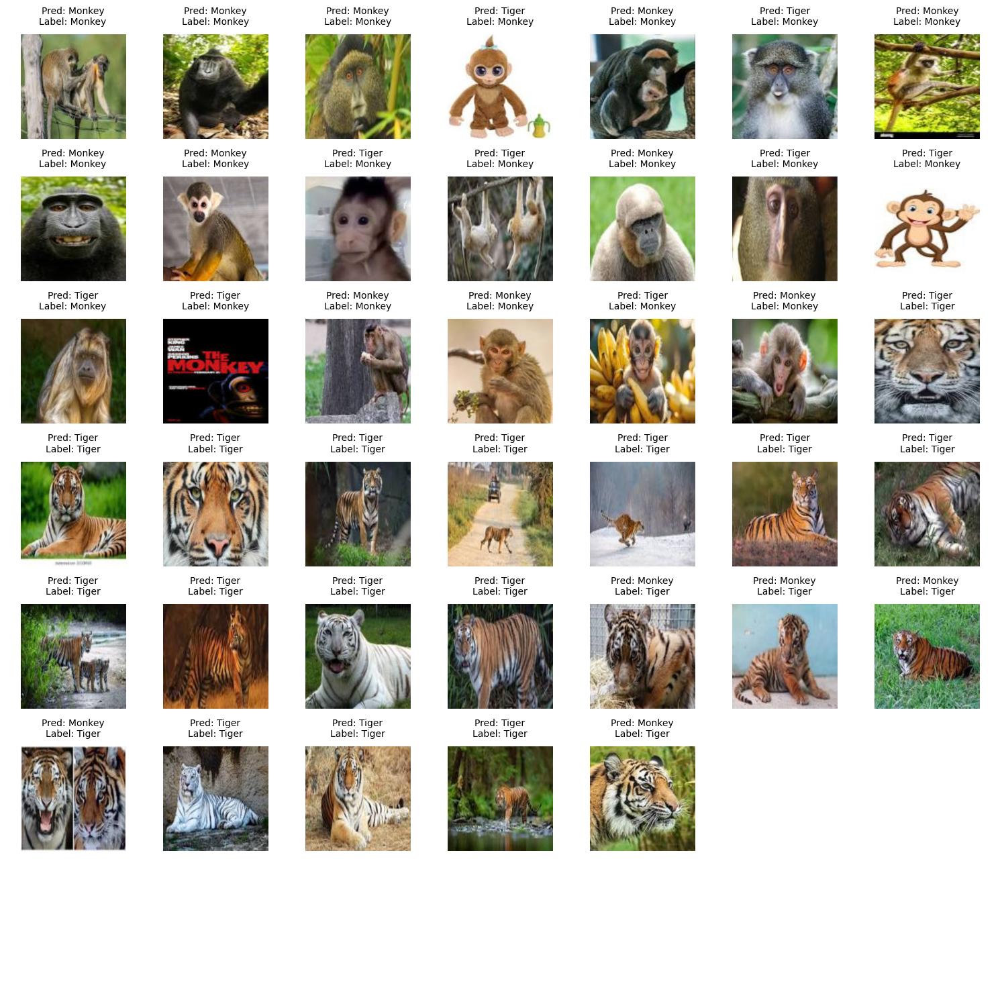

In [14]:
import matplotlib.pyplot as plt

# Ensure the model is in evaluation mode
model.eval()

# Initialize lists to store test images, predictions, and true labels
test_images = []
test_predictions = []
test_targets = []

# Disable gradient computation for inference
with torch.no_grad():
    for data, target in test_loader:
        # Convert string labels to numeric if necessary
        if isinstance(target, str):
            target = class_to_idx[target]
        elif isinstance(target, tuple) and isinstance(target[0], str):
            target = class_to_idx[target[0]]

        target = torch.tensor(target, dtype=torch.float, device=device).view(-1, 1)
        data = data.to(device)

        outputs = model(data)
        predicted = (outputs > 0.5).float()

        # Store the images, predictions, and targets
        test_images.extend(data.cpu())  # Add each image in the batch
        test_predictions.extend(predicted.cpu().numpy())  # Convert to numpy for easier processing
        test_targets.extend(target.cpu().numpy())  # Convert to numpy for easier processing

import math
import matplotlib.pyplot as plt

# Ensure the model is in evaluation mode
model.eval()

# Visualization setup
num_images = len(test_images)
grid_size = math.ceil(math.sqrt(num_images))  # Determine grid size dynamically
fig, axs = plt.subplots(grid_size, grid_size, figsize=(15, 15))  # Dynamic grid
axs = axs.flatten()  # Flatten to iterate easily over axes

for i, ax in enumerate(axs):
    if i >= num_images:
        ax.axis('off')  # Hide unused subplots
        continue

    img = test_images[i]
    pred = test_predictions[i]
    label = test_targets[i]

    # Revert normalization (if applied) and transform tensor to image
    img = img.permute(1, 2, 0).numpy()  # Convert from (C, H, W) to (H, W, C)
    img = (img - img.min()) / (img.max() - img.min())  # Rescale for visibility

    # Display the image with predictions and labels
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f"Pred: {'Monkey' if pred == 0 else 'Tiger'}\nLabel: {'Monkey' if label == 0 else 'Tiger'}",
                 fontsize=10, pad=10)  # Add padding between the image and the title

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.5, hspace=0.7)  # Add horizontal and vertical spacing
plt.tight_layout()
plt.show()




In [15]:
!zip -r runs_MLP_final.zip /content/runs


  adding: content/runs/ (stored 0%)
  adding: content/runs/SimpleCNN_with_string_labels/ (stored 0%)
  adding: content/runs/SimpleCNN_with_string_labels/events.out.tfevents.1731669335.cd93f97abf0d.514.0 (deflated 1%)


Prediction for Class_A_easy: Class B


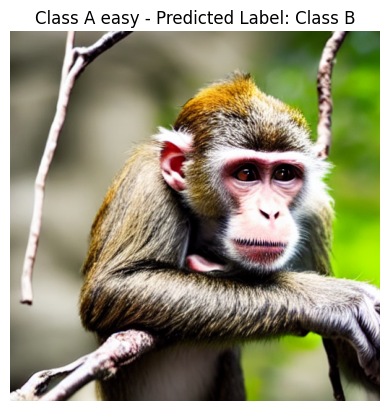

Prediction for Class_A_hard: Class B


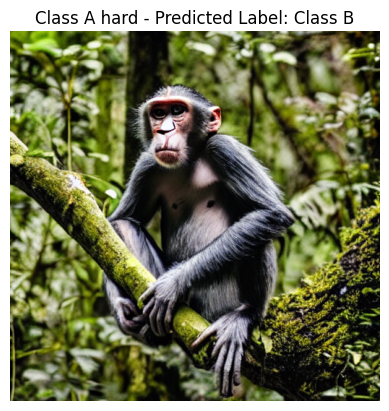

Prediction for Class_B_easy: Class B


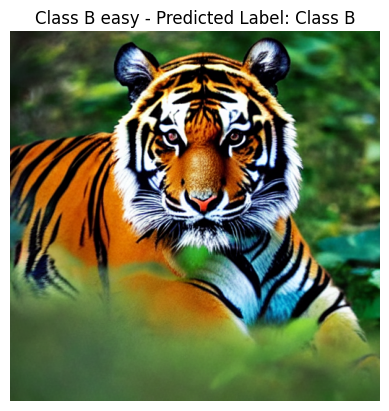

Prediction for Class_B_hard: Class B


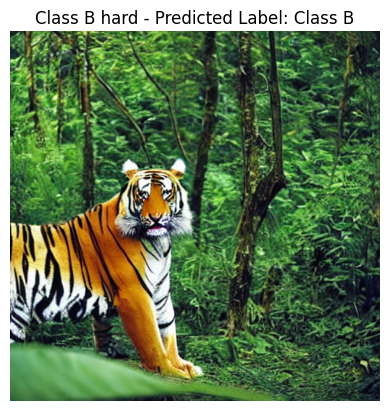

In [16]:
from PIL import Image
import torch
from torchvision import transforms
import matplotlib.pyplot as plt

# Define image transformations (resize and convert to tensor)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match model's expected input size
    transforms.ToTensor(),
])

# List of image paths and labels for each of the generated images
image_paths = {
    "Class_A_easy": "/content/generated_Class_A_easy.png",
    "Class_A_hard": "/content/generated_Class_A_hard.png",
    "Class_B_easy": "/content/generated_Class_B_easy.png",
    "Class_B_hard": "/content/generated_Class_B_hard.png",
}

# Initialize model for evaluation
model.eval()

# Loop through each generated image, process, predict, and display results
for label, path in image_paths.items():
    # Load and preprocess the image
    image = Image.open(path).convert("RGB")  # Ensure it's in RGB mode
    image = transform(image).unsqueeze(0)  # Add batch dimension
    image = image.to(device)  # Move to the same device as the model (e.g., CUDA)

    # Make prediction
    with torch.no_grad():
        output = model(image)
        prediction = (output > 0.5).float()  # Apply threshold for binary classification

    # Convert prediction to label
    predicted_label = "Class A" if prediction.item() == 0 else "Class B"
    print(f"Prediction for {label}: {predicted_label}")

    # Display the image with the predicted label
    plt.imshow(Image.open(path))
    plt.axis("off")
    plt.title(f"{label.replace('_', ' ')} - Predicted Label: {predicted_label}")
    plt.show()

MLP vs. Convolutional Neural Networks (CNNs): MLPs are purely fully connected networks, which typically require a lot of parameters and can overfit easily if the data is not large enough. In contrast, CNNs (like VGG16) are designed to handle spatial data (images) more efficiently by leveraging convolutional layers. CNNs tend to outperform MLPs in image classification tasks because they are better at capturing hierarchical patterns in images.

MLP Performance: While an MLP can work for image classification tasks, especially with the large number of neurons in the hidden layers, it may not perform as efficiently as CNN models like VGG16 because MLPs don't explicitly leverage the spatial structure of the image.

Conclusion: If the task is image classification, CNNs will generally outperform MLPs. MLPs can be useful for simpler tasks or when working with tabular data, but for image recognition, CNNs provide better performance.